# Multi-ROI 10X vs CP-SAM (MAX RECALL) comparison

Compares 10X cell calls against CP-SAM MAX RECALL (cprob=−5, flow=0, augment=True) across all 6 saved ROIs in `data/Xenium_Prime_Human_Skin_FFPE_xe_outs/`.

Sections:
1. Slide-level overview — where each ROI sits in the tissue
2. Per-ROI top-10 gene tables
3. Mask comparison (composite + 10X cells + CP-SAM cells per ROI)
4. Transcript-assignment comparison (gray=inside, red=orphan)
5. Summary table — cell counts and transcript-assignment % across all 6 ROIs


## 1. Setup

In [1]:
import warnings; warnings.filterwarnings("ignore")
from pathlib import Path
import json, time
import numpy as np, pandas as pd, tifffile, torch, zarr
import matplotlib.pyplot as plt
from skimage.segmentation import find_boundaries

DATA = Path("/Users/ik936/Partners HealthCare Dropbox/Ilya Korsunsky/cellarium/data/Xenium_Prime_Human_Skin_FFPE_xe_outs")
ROI_NAMES = ["ROI1", "ROI2", "ROI3", "ROI4", "ROI5", "ROI6"]

# Gene name lookup (gene_id → name)
tx_root    = zarr.open(zarr.ZipStore(DATA / "transcripts.zarr.zip", mode="r"), mode="r")
gene_names = list(tx_root.attrs["gene_names"])
print(f"gene_names loaded: {len(gene_names)} entries; first 5: {gene_names[:5]}")
print(f"MPS available: {torch.backends.mps.is_available()}")


gene_names loaded: 10017 entries; first 5: ['A2ML1', 'AAMP', 'AAR2', 'AARSD1', 'ABAT']
MPS available: True


In [2]:
# Load each ROI's metadata + data into a dict
def load_roi(name):
    d = DATA / name
    with open(d / "metadata.json") as f:
        meta = json.load(f)
    return {
        "name":     name,
        "meta":     meta,
        "dapi":     tifffile.imread(d / "morphology_DAPI.tif"),
        "s18":      tifffile.imread(d / "morphology_18S.tif"),
        "masks_10x": tifffile.imread(d / "cells_10x_masks.tif"),
        "df_tx":    pd.read_parquet(d / "transcripts.parquet"),
        "df_poly":  pd.read_parquet(d / "cells_10x_polygons.parquet"),
    }

rois = {n: load_roi(n) for n in ROI_NAMES}
for n, r in rois.items():
    bb = r["meta"]["bbox_um"]
    print(f"{n}: x[{bb['x0_um']:.0f}, {bb['x1_um']:.0f}] y[{bb['y0_um']:.0f}, {bb['y1_um']:.0f}]"
          f"  cells_10x={r['meta']['n_cells_in_mask']}  tx={len(r['df_tx']):,}")


ROI1: x[960, 1220] y[2930, 3060]  cells_10x=158  tx=51,388
ROI2: x[640, 1040] y[3370, 3580]  cells_10x=469  tx=265,902
ROI3: x[8250, 8500] y[1000, 1250]  cells_10x=698  tx=183,739
ROI4: x[1500, 1750] y[2250, 2500]  cells_10x=561  tx=157,209
ROI5: x[6750, 7000] y[3000, 3250]  cells_10x=412  tx=136,419
ROI6: x[1250, 1500] y[3500, 3750]  cells_10x=248  tx=96,475


In [3]:
def normalize_for_display(img, low=1, high=99):
    lo, hi = np.percentile(img, [low, high])
    return np.clip((img.astype(np.float32) - lo) / max(hi - lo, 1e-6), 0, 1)

def composite_blue_yellow(dapi, s18):
    H, W = dapi.shape
    rgb = np.zeros((H, W, 3), dtype=np.float32)
    rgb[..., 0] = s18; rgb[..., 1] = s18; rgb[..., 2] = dapi
    return np.clip(rgb, 0, 1)

def shuffle_labels(masks, seed=0):
    masks = masks.astype(np.int64)
    n = int(masks.max())
    if n == 0: return masks
    perm = np.concatenate([[0], np.random.default_rng(seed).permutation(np.arange(1, n + 1))])
    return perm[masks]

def label_overlay(masks, seed, alpha_fill=0.45, edge_alpha=1.0, edge_color=(1,1,1)):
    masks = masks.astype(np.int64)
    n = int(masks.max())
    if n == 0:
        return np.zeros((*masks.shape, 4), dtype=np.float32)
    shuf = shuffle_labels(masks, seed=seed)
    cmap = plt.get_cmap("nipy_spectral")
    rgba = cmap(shuf / max(n, 1))
    rgba[..., 3] = alpha_fill * (masks > 0)
    edges = find_boundaries(masks, mode="outer")
    rgba[edges, 0] = edge_color[0]; rgba[edges, 1] = edge_color[1]
    rgba[edges, 2] = edge_color[2]; rgba[edges, 3] = edge_alpha
    return rgba

# Pre-compute composite + extent per ROI
for n, r in rois.items():
    r["dapi_n"]    = normalize_for_display(r["dapi"])
    r["s18_n"]     = normalize_for_display(r["s18"])
    r["composite"] = composite_blue_yellow(r["dapi_n"], r["s18_n"])
    bb = r["meta"]["bbox_um"]
    r["extent"]    = [bb["x0_um"], bb["x1_um"], bb["y1_um"], bb["y0_um"]]
print("composites built")


composites built


## 2. Slide overview

Where each ROI sits on the full slide (cell centroid scatter).

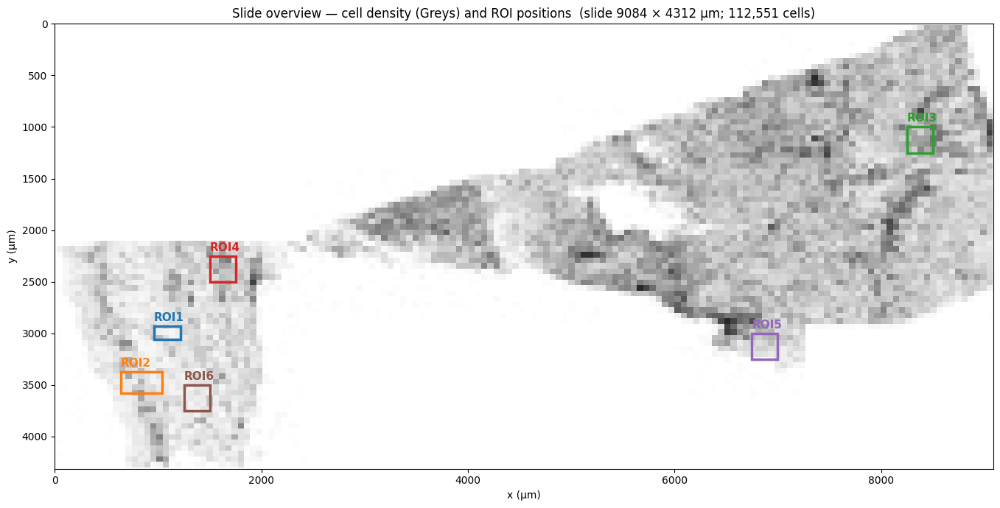

In [4]:
cells_root = zarr.open(zarr.ZipStore(DATA / "cells.zarr.zip", mode="r"), mode="r")
cell_summary = cells_root["cell_summary"][:]
H_PX, W_PX = cells_root["masks"]["1"].shape
slide_W = W_PX * 0.2125; slide_H = H_PX * 0.2125

fig, ax = plt.subplots(figsize=(15, 7))
# 2D density rather than 112k dots
counts, xedges, yedges = np.histogram2d(cell_summary[:, 0], cell_summary[:, 1],
                                         bins=[150, 80])
ax.imshow(counts.T, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]],
          origin="upper", aspect="equal", cmap="Greys", alpha=0.85)

colors = plt.get_cmap("tab10").colors
for k, n in enumerate(ROI_NAMES):
    bb = rois[n]["meta"]["bbox_um"]
    ax.add_patch(plt.Rectangle((bb["x0_um"], bb["y0_um"]), bb["x1_um"]-bb["x0_um"],
                                bb["y1_um"]-bb["y0_um"],
                                fc="none", ec=colors[k], lw=2.5))
    ax.text(bb["x0_um"], bb["y0_um"]-50, n, color=colors[k], fontsize=11, fontweight="bold")

ax.set_xlabel("x (µm)"); ax.set_ylabel("y (µm)")
ax.set_title(f"Slide overview — cell density (Greys) and ROI positions  "
             f"(slide {slide_W:.0f} × {slide_H:.0f} µm; {len(cell_summary):,} cells)")
ax.set_xlim(0, slide_W); ax.set_ylim(slide_H, 0)
plt.tight_layout(); plt.show()


## 3. Top 10 genes per ROI

From the saved transcripts (qv≥20, is_gene only).

In [5]:
def top_genes(df_tx, k=10):
    counts = df_tx["gene_id"].value_counts().head(k)
    out = pd.DataFrame({
        "rank":      np.arange(1, len(counts)+1),
        "gene":      [gene_names[int(gid)] for gid in counts.index],
        "tx_count":  counts.values,
        "tx_pct":    100 * counts.values / len(df_tx),
    })
    return out

for n in ROI_NAMES:
    print(f"\n=== {n} (total tx={len(rois[n]['df_tx']):,}) — top 10 genes ===")
    print(top_genes(rois[n]["df_tx"]).to_string(index=False, formatters={"tx_pct": "{:.1f}%".format}))



=== ROI1 (total tx=51,388) — top 10 genes ===
 rank   gene  tx_count tx_pct
    1  POSTN       800   1.6%
    2  EEF1G       715   1.4%
    3  THBS1       492   1.0%
    4 COL5A1       421   0.8%
    5   COMP       388   0.8%
    6   THY1       383   0.7%
    7 COL5A2       287   0.6%
    8  MMP14       284   0.6%
    9  EPAS1       264   0.5%
   10   CTSK       255   0.5%

=== ROI2 (total tx=265,902) — top 10 genes ===
 rank    gene  tx_count tx_pct
    1   EEF1G      7260   2.7%
    2   POSTN      3064   1.2%
    3    LDHA      1565   0.6%
    4 TMEM45A      1508   0.6%
    5   H3F3B      1458   0.5%
    6   YWHAZ      1435   0.5%
    7   ANXA2      1360   0.5%
    8    DSG1      1310   0.5%
    9   HOXB7      1267   0.5%
   10  CDKN1A      1219   0.5%

=== ROI3 (total tx=183,739) — top 10 genes ===
 rank   gene  tx_count tx_pct
    1  POSTN      3538   1.9%
    2  EEF1G      2222   1.2%
    3  MMP13      1083   0.6%
    4  MMP14      1053   0.6%
    5  HOXB7      1036   0.6%
    6 

## 4. Run CP-SAM MAX RECALL on all 6 ROIs

`cellprob_threshold=-5, flow_threshold=0.0, augment=True` — the validated max-recall config.

In [6]:
from cellpose import models as cp_modern

m_sam = cp_modern.CellposeModel(gpu=True, pretrained_model="cpsam")
print(f"cpsam loaded on: {m_sam.device}\n")

for n, r in rois.items():
    img_2ch = np.stack([r["dapi_n"], r["s18_n"]], axis=-1).astype(np.float32)
    t0 = time.time()
    masks_sam, _, _ = m_sam.eval(
        img_2ch, channel_axis=-1, diameter=None, niter=200,
        cellprob_threshold=-5.0, flow_threshold=0.0, augment=True,
    )
    r["masks_sam"] = masks_sam
    n_10x = len(np.unique(r['masks_10x']))-1
    print(f"  {n}: cpsam={int(masks_sam.max()):>4d} cells   10x={n_10x:>4d} cells   "
          f"({time.time()-t0:.1f}s)")


cpsam loaded on: mps



  ROI1: cpsam= 257 cells   10x= 158 cells   (15.3s)


  ROI2: cpsam= 660 cells   10x= 469 cells   (26.1s)


  ROI3: cpsam= 898 cells   10x= 698 cells   (16.0s)


  ROI4: cpsam= 715 cells   10x= 561 cells   (17.3s)


  ROI5: cpsam= 625 cells   10x= 412 cells   (17.6s)


  ROI6: cpsam= 478 cells   10x= 248 cells   (18.4s)


## 5. Mask comparison — composite | 10X cells | CP-SAM cells (per ROI)

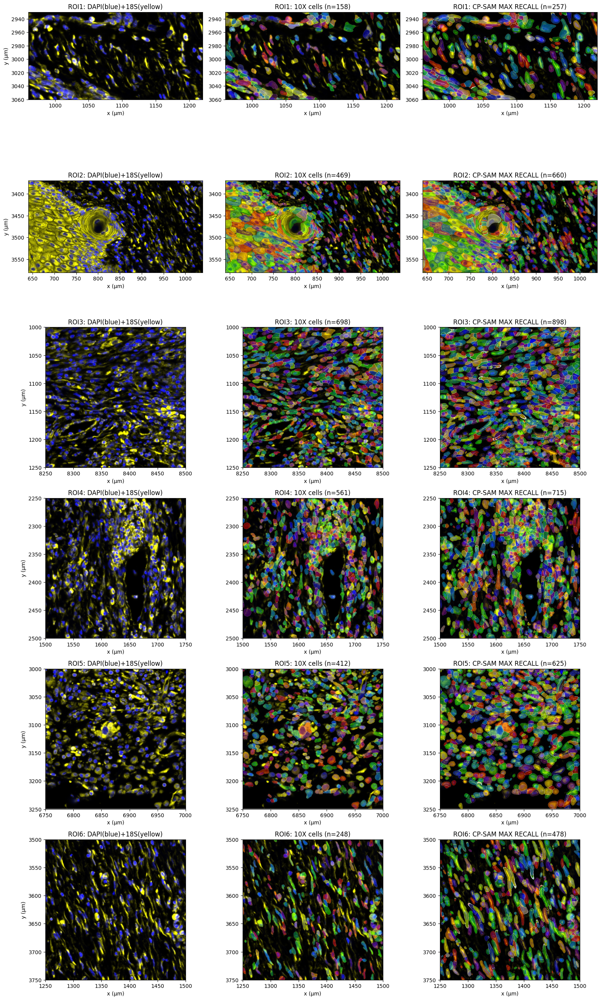

In [7]:
fig, ax = plt.subplots(len(ROI_NAMES), 3, figsize=(16, 4.5*len(ROI_NAMES)))
for i, n in enumerate(ROI_NAMES):
    r = rois[n]
    ext = r["extent"]
    ax[i, 0].imshow(r["composite"], aspect="equal", extent=ext)
    ax[i, 0].set_title(f"{n}: DAPI(blue)+18S(yellow)"); ax[i, 0].set_ylabel("y (µm)")

    ax[i, 1].imshow(r["composite"], aspect="equal", extent=ext)
    ax[i, 1].imshow(label_overlay(r["masks_10x"], seed=10+i), aspect="equal", extent=ext)
    ax[i, 1].set_title(f"{n}: 10X cells (n={len(np.unique(r['masks_10x']))-1})")

    ax[i, 2].imshow(r["composite"], aspect="equal", extent=ext)
    ax[i, 2].imshow(label_overlay(r["masks_sam"], seed=20+i), aspect="equal", extent=ext)
    ax[i, 2].set_title(f"{n}: CP-SAM MAX RECALL (n={int(r['masks_sam'].max())})")

    for j in range(3):
        ax[i, j].set_xlabel("x (µm)")
plt.tight_layout(); plt.show()


## 6. Transcript-assignment comparison — gray=inside cell, red=orphan

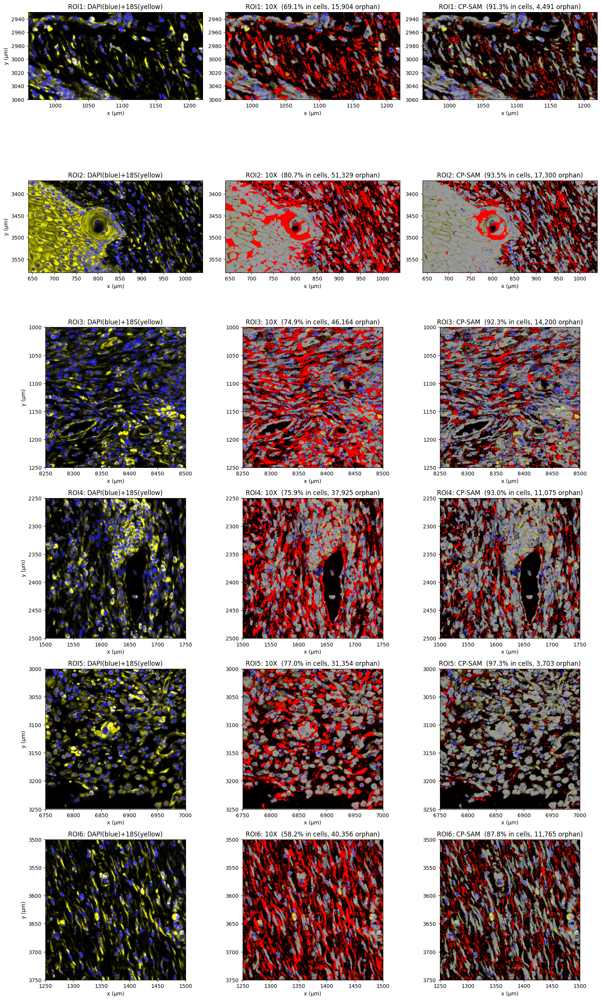

In [8]:
def transcripts_inside(masks, df_tx, x0_um, y0_um, pixel_size):
    H, W = masks.shape
    px = ((df_tx["x_um"].to_numpy() - x0_um) / pixel_size).astype(int)
    py = ((df_tx["y_um"].to_numpy() - y0_um) / pixel_size).astype(int)
    inb = (px >= 0) & (px < W) & (py >= 0) & (py < H)
    inside = np.zeros(len(df_tx), dtype=bool)
    inside[inb] = masks[py[inb], px[inb]] > 0
    return inside

fig, ax = plt.subplots(len(ROI_NAMES), 3, figsize=(16, 4.5*len(ROI_NAMES)))
for i, n in enumerate(ROI_NAMES):
    r = rois[n]
    bb, ext, ps = r["meta"]["bbox_um"], r["extent"], r["meta"]["pixel_size_um"]

    ax[i, 0].imshow(r["composite"], aspect="equal", extent=ext)
    ax[i, 0].set_title(f"{n}: DAPI(blue)+18S(yellow)"); ax[i, 0].set_ylabel("y (µm)")

    for j, (label, masks, seed) in enumerate([
        ("10X",     r["masks_10x"], 30),
        ("CP-SAM",  r["masks_sam"], 40),
    ]):
        a = ax[i, j+1]
        inside = transcripts_inside(masks, r["df_tx"], bb["x0_um"], bb["y0_um"], ps)
        n_in, n_out = int(inside.sum()), int((~inside).sum())
        a.imshow(r["composite"], aspect="equal", extent=ext)
        a.scatter(r["df_tx"].loc[inside,  "x_um"], r["df_tx"].loc[inside,  "y_um"],
                  s=1.0, c="0.6", alpha=0.45, edgecolors="none")
        a.scatter(r["df_tx"].loc[~inside, "x_um"], r["df_tx"].loc[~inside, "y_um"],
                  s=2.0, c="red",  alpha=0.7, edgecolors="none")
        a.set_xlim(bb["x0_um"], bb["x1_um"]); a.set_ylim(bb["y1_um"], bb["y0_um"])
        a.set_title(f"{n}: {label}  ({100*n_in/(n_in+n_out):.1f}% in cells, {n_out:,} orphan)")

    for j in range(3):
        ax[i, j].set_xlabel("x (µm)")
plt.tight_layout(); plt.show()


## 7. Summary table

In [9]:
rows = []
for n, r in rois.items():
    bb, ps = r["meta"]["bbox_um"], r["meta"]["pixel_size_um"]
    in_10x  = transcripts_inside(r["masks_10x"], r["df_tx"], bb["x0_um"], bb["y0_um"], ps)
    in_sam  = transcripts_inside(r["masks_sam"], r["df_tx"], bb["x0_um"], bb["y0_um"], ps)
    rows.append({
        "ROI": n,
        "size_um": f"{bb['x1_um']-bb['x0_um']:.0f}×{bb['y1_um']-bb['y0_um']:.0f}",
        "n_tx": len(r["df_tx"]),
        "n_cells_10X":     int(len(np.unique(r["masks_10x"]))-1),
        "n_cells_CPSAM":   int(r["masks_sam"].max()),
        "tx%_10X":   100 * in_10x.mean(),
        "tx%_CPSAM": 100 * in_sam.mean(),
        "delta_pp":  100 * (in_sam.mean() - in_10x.mean()),
    })
summary = pd.DataFrame(rows)
print(summary.to_string(index=False, formatters={
    "tx%_10X":   "{:.1f}".format,
    "tx%_CPSAM": "{:.1f}".format,
    "delta_pp":  "{:+.1f}".format,
}))
print(f"\n  totals across slide: 10X assigned {sum(r['tx%_10X']*r['n_tx']/100 for r in rows)/sum(r['n_tx'] for r in rows)*100:.1f}%, "
      f"CP-SAM assigned {sum(r['tx%_CPSAM']*r['n_tx']/100 for r in rows)/sum(r['n_tx'] for r in rows)*100:.1f}%")


 ROI size_um   n_tx  n_cells_10X  n_cells_CPSAM tx%_10X tx%_CPSAM delta_pp
ROI1 260×130  51388          158            257    69.1      91.3    +22.2
ROI2 400×210 265902          469            660    80.7      93.5    +12.8
ROI3 250×250 183739          698            898    74.9      92.3    +17.4
ROI4 250×250 157209          561            715    75.9      93.0    +17.1
ROI5 250×250 136419          412            625    77.0      97.3    +20.3
ROI6 250×250  96475          248            478    58.2      87.8    +29.6

  totals across slide: 10X assigned 75.0%, CP-SAM assigned 93.0%
